In [ ]:
%%capture
!   pip install adjustText
from adjustText import adjust_text
import networkx as nx
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

import google.colab.drive
google.colab.drive.mount('/content/drive')
warnings.filterwarnings("ignore")

# Carica i dati
df = pd.read_csv('/content/drive/MyDrive/social_network/got_new/nodi_statistiche.csv')

# Funzioni

In [ ]:
def print_top_characters(df, attribute, num_characters):
  sorted_df = df.sort_values(by=[attribute], ascending=False)
  top_characters = sorted_df[['Id', attribute]].head(num_characters)
  display(top_characters.T)
  return sorted_df.head(num_characters)

In [ ]:
def plot_stat_graphs(df, feature, x_attr, num_characters):
  def plot_histogram(df, attribute, ax):
    sns.histplot(df[feature], bins=15, kde=True, color='blue', ax=ax)
    ax.set_title(f'Distribution of {attribute}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')

  def plot_histogram_log_scale(df, attribute, ax):
    sns.histplot(df[attribute], bins=15, kde=True, color='blue', log_scale=(False, True), ax=ax)
    ax.set_title(f'Distribution of {attribute} (Logarithmic Scale)')
    ax.set_xlabel(attribute)
    ax.set_ylabel('Frequency (Logarithmic Scale)')

  def plot_top_points_with_regression(df, attribute, num_characters, x_attr, ax):
    sorted_df = df.sort_values(by=[x_attr], ascending=False)
    top_df = sorted_df.head(num_characters*2)  # Take top 20 for scatter plot
    sns.regplot(x=x_attr, y=attribute, data=top_df, scatter_kws={'s': 10},
                line_kws={'color': 'red'}, truncate=False, ax=ax)
    ax.set_title(f'Relationship between {x_attr} and {attribute} (Top {num_characters*2})')
    ax.set_xlabel(x_attr)
    ax.set_ylabel(attribute)
    for i in range(top_df.shape[0]):
        ax.text(x=top_df[x_attr].iloc[i], y=top_df[attribute].iloc[i],
                 s=top_df['Id'].iloc[i], fontsize=6, color='black')

  fig, axes = plt.subplots(1, 3, figsize=(16, 4))  # Create 1 row, 3 columns of plots

  plot_histogram(df, feature, axes[0])
  plot_histogram_log_scale(df, feature, axes[1])
  plot_top_points_with_regression(df, feature, num_characters, x_attr, axes[2])

  # Adjust layout to prevent overlap
  plt.tight_layout()
  plt.show()

In [ ]:
# GraphML: crea un grafo
G = nx.read_graphml("/content/drive/MyDrive/social_network/got_temp/got.graphml")

In [ ]:
# Colori per la personalizzazione
NODE_SELECT = 'navy'
NODE_DEFAULT = 'silver'
NODE_CONNECT = 'cornflowerblue'
EDGE_SELECT = NODE_SELECT
EDGE_DEFAULT = 'silver'
EDGE_CONNECT = NODE_CONNECT


#Calcola dimensioni e colori dei nodi
def calculate_node_properties(G, ris, attribute, node_flag):
  max_size, min_size = 200, 3
  centrality_values = [df.loc[df['Id'] == node, attribute].values[0] for node in G.nodes()]
  node_sizes = [
      min_size + (max_size - min_size) * (val - min(centrality_values)) / (max(centrality_values) - min(centrality_values))
      for val in centrality_values
  ]

  # Colora i nodi selezionati
  node_colors = [NODE_SELECT if node in ris['Id'].values else NODE_DEFAULT for node in G.nodes()]

  # Aggiorna colori dei nodi collegati ai nodi rossi
  if node_flag:
    for node_red in ris['Id']:
        for neighbor in G.neighbors(node_red):
          if neighbor not in ris['Id']:
            idx = list(G.nodes()).index(neighbor)
            if node_colors[idx] != NODE_SELECT:
              node_colors[idx] = NODE_CONNECT

  return node_sizes, node_colors

#Calcola proprietà degli archi
def calculate_edge_properties(G, ris, edge_flag):
  edge_colors, edge_widths, edge_alphas = [], [], []
  for u, v in G.edges():
    if u in ris['Id'].values and v in ris['Id'].values:
        edge_colors.append(EDGE_SELECT)
        edge_widths.append(1.0)
        edge_alphas.append(0.8)
    elif u in ris['Id'].values or v in ris['Id'].values:
        edge_colors.append(EDGE_CONNECT)
        edge_widths.append(0.6)
        edge_alphas.append(0.4)
    else:
        edge_colors.append(EDGE_DEFAULT)
        edge_widths.append(0.4)
        edge_alphas.append(0.2)

  if not edge_flag:
      return ['gray'] * len(G.edges()), edge_widths, edge_alphas
  else:
      return edge_colors, edge_widths, edge_alphas

#Aggiunge etichette ai nodi
def add_labels(pos, ris, arrow_flag, node_label_flag, G):
  label_texts = []

  # Etichette per nodi rossi
  red_labels = {node: node for node in ris['Id']}
  for node, label in red_labels.items():
      x, y = pos[node]
      label_texts.append(plt.text(x+ 0.02, y + 0.02, label, fontsize=9, bbox=dict(boxstyle="round,pad=0.2", fc='white', ec=NODE_SELECT, lw=0.5), zorder=5))

  # Regola le etichette con frecce se `arrow=True`
  if arrow_flag:
      adjust_text(
          label_texts,
          arrowprops=dict(arrowstyle='->', color='black', lw=0.5),
          only_move={'points': 'y', 'text': 'y'},
          expand_text=(1.5, 1.5),
          force_points=1.5,
          force_text=1.8,
          lim=200
      )

  # Etichette per nodi collegati, se node_label=True
  if node_label_flag:
    for node_red in ris['Id']:
      for neighbor in G.neighbors(node_red):
        if neighbor not in ris['Id'] and str(neighbor) not in red_labels:
          x, y = pos[neighbor]
          plt.text(x, y - 0.05, str(neighbor), fontsize=7, color='midnightblue',bbox=dict(boxstyle="round,pad=0.1", fc='white', ec="none", alpha=0.5))

def graph_visualization(attribute, ris, G, title='', edge=False, node=False, arrow=False, node_label=False):
  plt.figure(figsize=(12, 9))
  plt.title(title, fontsize=16)

  pos = nx.spring_layout(G, k=0.5, iterations=50)
  node_sizes, node_colors = calculate_node_properties(G, ris, attribute, node)
  # Calcola proprietà degli archi
  edge_colors, edge_widths, edge_alphas = calculate_edge_properties(G, ris, edge)
  # Disegna archi
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_widths, alpha=edge_alphas)
  # Disegna nodi
  nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9, linewidths=0.2)
  # Aggiungi etichette
  add_labels(pos, ris, arrow, node_label, G)
  # Aggiungi legenda

  if node or edge:
    legend_elements = []
    if node:
      legend_elements += [
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_SELECT, markersize=10, label='Selected Nodes'),
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_CONNECT, markersize=10, label='Nodes Connected to Selected'),
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_DEFAULT, markersize=10, label='Other Nodes')
      ]
    else:
      legend_elements += [
        plt.Line2D([], [], marker='_', color=EDGE_SELECT, markersize=10, label='Edges Connected to Selected Nodes'),
        plt.Line2D([], [], marker='_', color=EDGE_CONNECT, markersize=10, label='Edges Connected to Selected Nodes'),
        plt.Line2D([], [], marker='_', color=EDGE_DEFAULT, markersize=10, label='Other Edges')
    ]
    plt.legend(handles=legend_elements, loc='upper right', fontsize='small')

  # Finalizza il grafico
  plt.axis('off')
  plt.tight_layout()
  plt.show()

In [ ]:
def filtered_graph_visualization(attribute, ris, G, n, title='', edge=False, node=False, arrow=False, node_label=False):
    # Ordina i nodi in base all'attributo
    sorted_nodes = sorted(G.nodes(data=True), key=lambda x: df.loc[df['Id'] == x[0], attribute].values[0],reverse=True)
    # Prendi i primi n nodi
    top_n_nodes = {node[0] for node in sorted_nodes[:n]}

    # Crea un sottografo contenente solo i nodi selezionati e i loro collegamenti interni
    subgraph = G.subgraph(top_n_nodes).copy()

    # Filtra 'ris' per includere solo i nodi presenti nel sottografo
    filtered_ris = ris[ris['Id'].isin(top_n_nodes)]

    # Chiama la funzione originale per visualizzare il sottografo
    graph_visualization(attribute=attribute,ris=filtered_ris,G=subgraph,title=title,edge=edge,node=node,arrow=arrow,node_label=node_label)


# Grafo

In [ ]:
# Load nodes from CSV
edges_df = pd.read_csv('/content/drive/MyDrive/social_network/got_new/dati/asoiaf-all-edges.csv')  # Replace 'nodes.csv' with your file name
# Assuming 'nodes.csv' has columns like 'Id', 'Label', etc.

# Load edges from CSV
nodes_df = pd.read_csv('/content/drive/MyDrive/social_network/got_new/nodi_statistiche.csv')  # Replace 'edges.csv' with your file name
# Assuming 'edges.csv' has columns like 'Source', 'Target', etc.

# Create the graph
G = nx.Graph()


# Add nodes to the graph
for index, row in nodes_df.iterrows():
    node_id = row['Id'] # Assuming 'Id' is the column for node identifiers
    G.add_node(node_id, **row.drop('Id').to_dict()) # Add all columns except 'Id' as attributes

# Add edges to the graph
for index, row in edges_df.iterrows():
    G.add_edge(row['Source'], row['Target'])  # Adjust column names as needed


In [ ]:
top_n = 10

#**ANALISI PRELIMINARI**

## **Degree**:  
   La misura di *degree* si riferisce al numero di connessioni dirette (o legami) che un nodo (personaggio) ha con altri nodi (altri personaggi) nella rete. In *Game of Thrones*, i personaggi con un *high degree* sono quelli che interagiscono con molti altri personaggi, che formano alleanze e relazioni con molti altri.
   - **Utilità**: Identifica i personaggi più "connessi" o influenti a livello di relazioni dirette. Un alto grado potrebbe anche indicare una forte visibilità o potere sociale.

In [ ]:
feature = 'degree'
ris = print_top_characters(df, feature, top_n)

,10,59,4,2,24,68,14,138,20,15
Id,Tyrion-Lannister,Jon-Snow,Jaime-Lannister,Cersei-Lannister,Stannis-Baratheon,Arya-Stark,Catelyn-Stark,Sansa-Stark,Eddard-Stark,Robb-Stark
degree,122,114,101,97,89,84,75,75,74,74


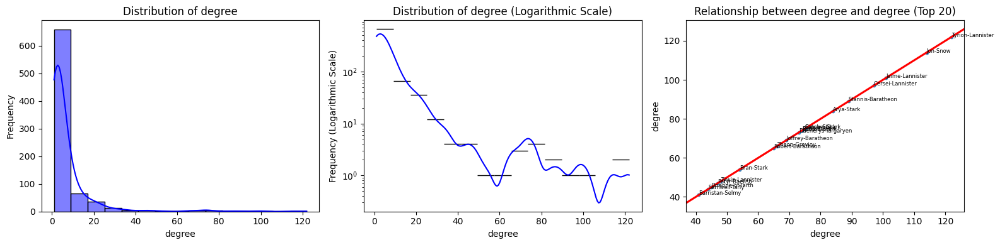

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

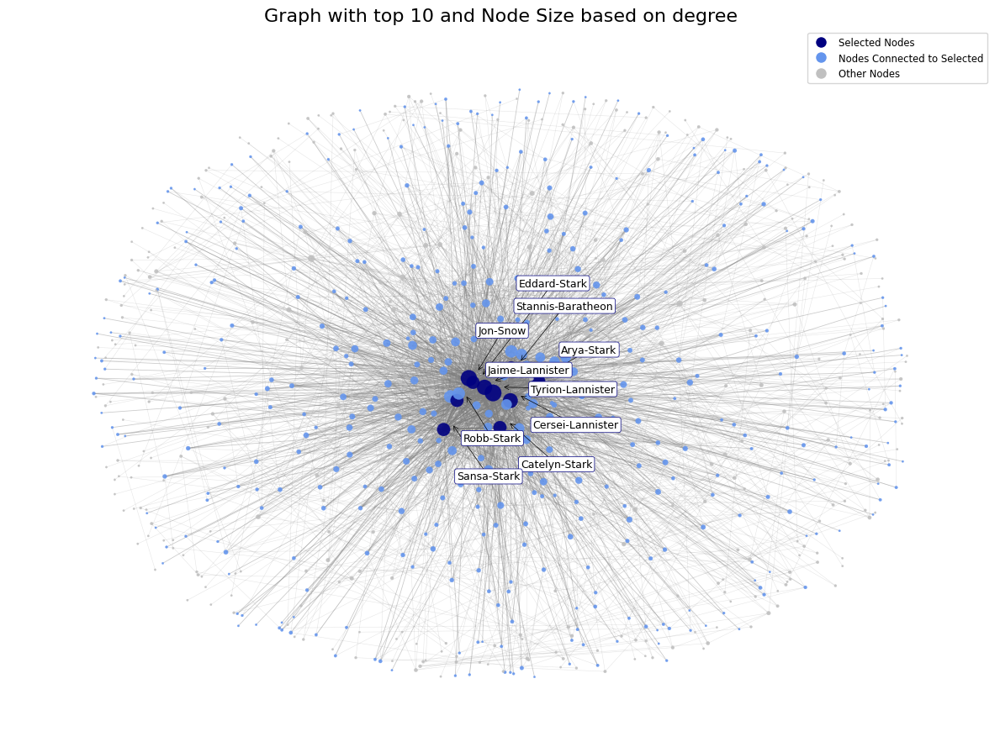

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}', node=True)

## **Betweenness Centrality**:  
   La *betweenness centrality* misura quanto un nodo funge da "ponte" tra altri due nodi. Un nodo con alta *betweenness* può controllare il flusso di informazioni e risorse tra altre persone nella rete. In *Game of Thrones*, personaggi come Varys o Petyr Baelish, che manipolano eventi e informazioni tra case e regni, potrebbero avere un’alta *betweenness*.
   - **Utilità**: Aiuta a identificare i personaggi che esercitano un'influenza strategica nel collegare gruppi o personaggi, possibili burattinai dietro le quinte.

In [ ]:
feature = 'betweenesscentrality'
ris = print_top_characters(df, feature, top_n)

,59,10,19,70,24,4,2,68,20,64
Id,Jon-Snow,Tyrion-Lannister,Daenerys-Targaryen,Theon-Greyjoy,Stannis-Baratheon,Jaime-Lannister,Cersei-Lannister,Arya-Stark,Eddard-Stark,Robert-Baratheon
betweenesscentrality,0.19212,0.162191,0.118418,0.111283,0.11014,0.100838,0.088704,0.087242,0.078732,0.078228


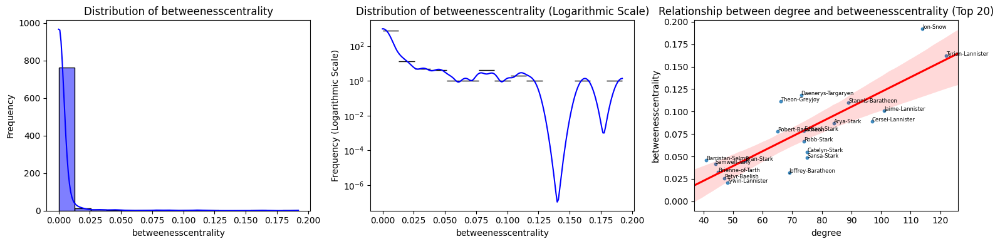

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

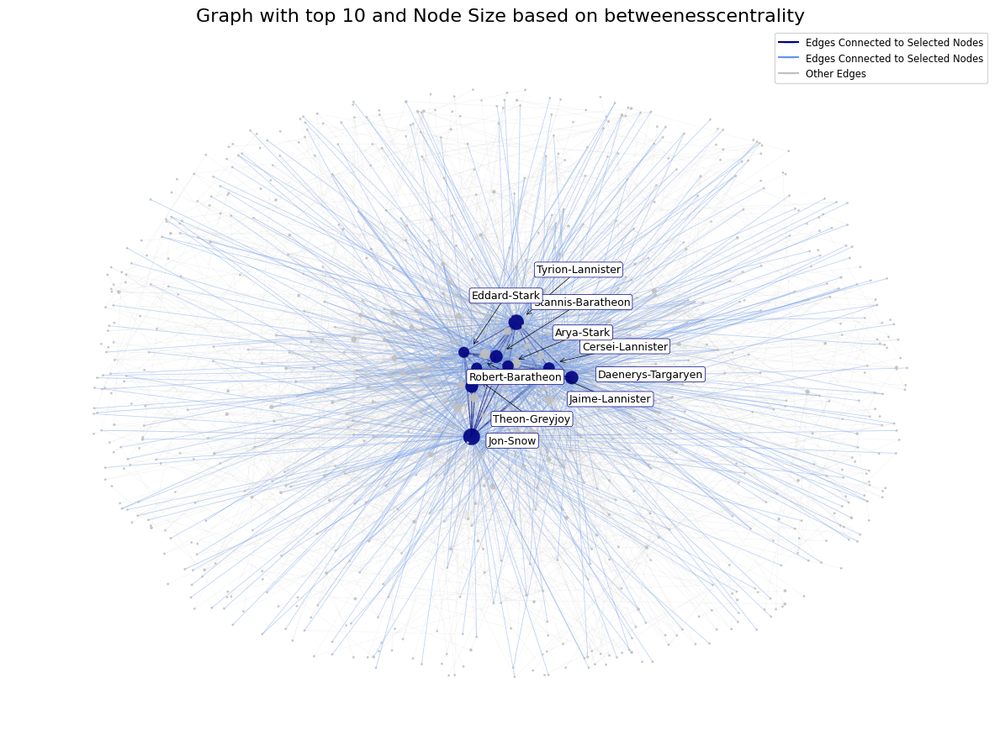

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}', edge=True)

## **Closeness Centrality**:  
   La *closeness centrality* misura la distanza media di un nodo dagli altri nodi nella rete, e quindi quanto velocemente un nodo può raggiungere tutti gli altri. Un personaggio con alta *closeness* è in grado di accedere rapidamente a informazioni e prendere decisioni rapide, come Jon Snow o Tyrion Lannister.
   - **Utilità**: Indica i personaggi che sono in una posizione strategica per influenzare rapidamente l'intera rete, con impatti sulle decisioni politiche e sulle alleanze.


In [ ]:
feature = 'closnesscentrality'
ris = print_top_characters(df, feature, top_n)

,10,64,20,2,4,59,24,15,6,14
Id,Tyrion-Lannister,Robert-Baratheon,Eddard-Stark,Cersei-Lannister,Jaime-Lannister,Jon-Snow,Stannis-Baratheon,Robb-Stark,Joffrey-Baratheon,Catelyn-Stark
closnesscentrality,0.476333,0.459272,0.455849,0.454545,0.451961,0.445378,0.444631,0.444134,0.433952,0.433479


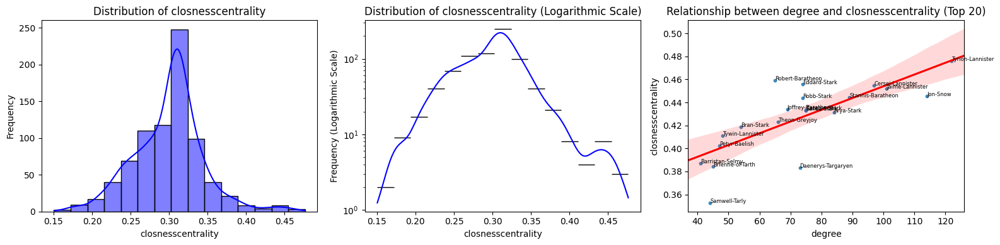

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

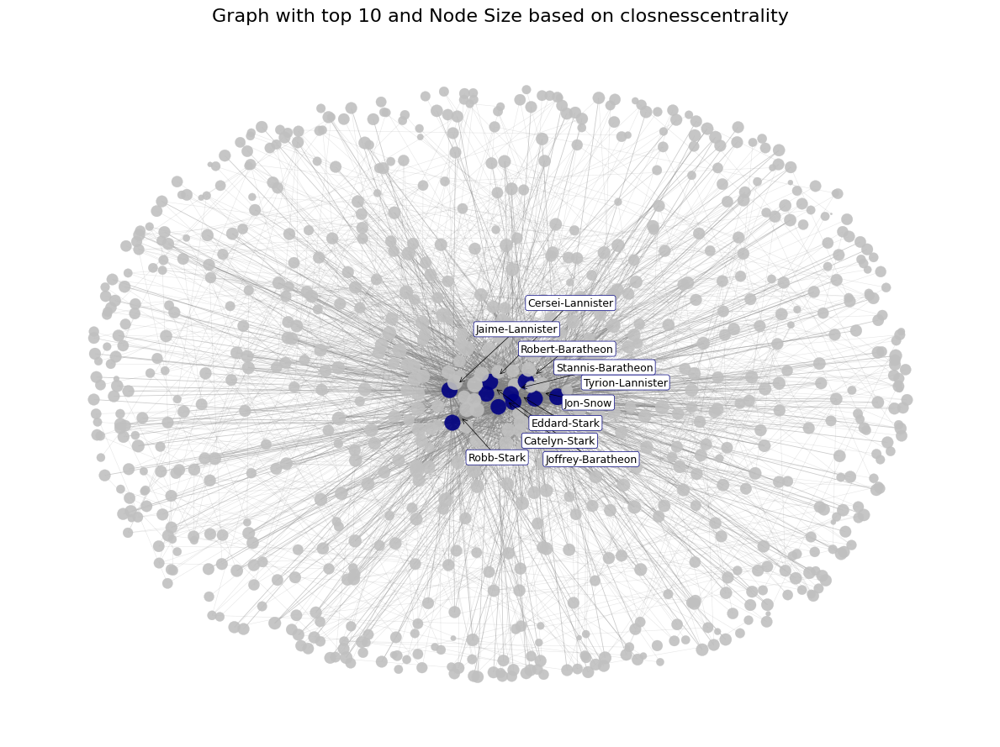

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}')

## **PageRank**:  
   Il *PageRank* è una misura di importanza basata sul numero e sulla qualità dei collegamenti entranti, personaggi con molti alleati potenti, come Daenerys Targaryen o Cersei Lannister, avrebbero un alto *PageRank*, poiché le loro azioni e alleanze sono seguite e influenzano gli altri.
   - **Utilità**: Utile per identificare i leader o i personaggi con il maggiore impatto a livello globale, non solo per il numero di alleanze, ma anche per la qualità di queste.

In [ ]:
feature = 'pageranks'
ris = print_top_characters(df, feature, top_n)

,59,10,4,24,68,2,19,70,20,14
Id,Jon-Snow,Tyrion-Lannister,Jaime-Lannister,Stannis-Baratheon,Arya-Stark,Cersei-Lannister,Daenerys-Targaryen,Theon-Greyjoy,Eddard-Stark,Catelyn-Stark
pageranks,0.019,0.018362,0.015461,0.01365,0.013448,0.013362,0.013048,0.01204,0.011485,0.011187


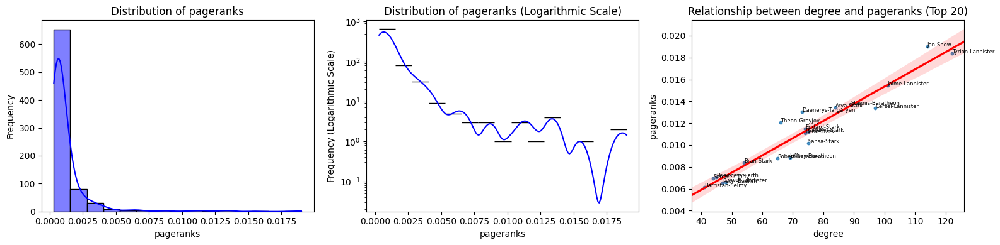

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

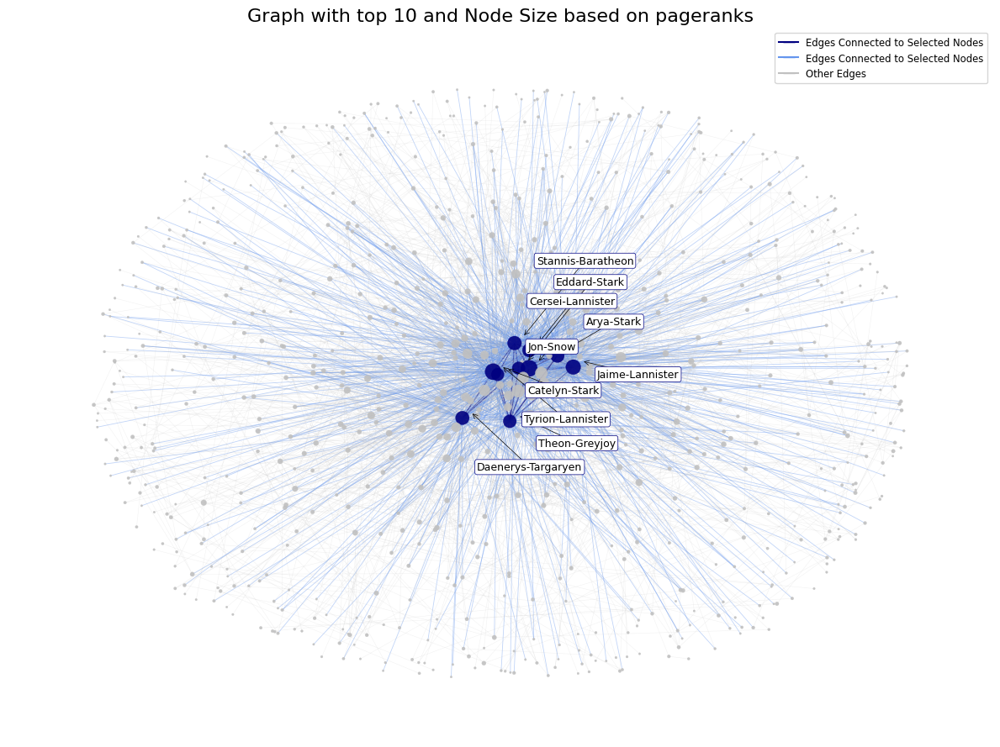

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}', edge=True)

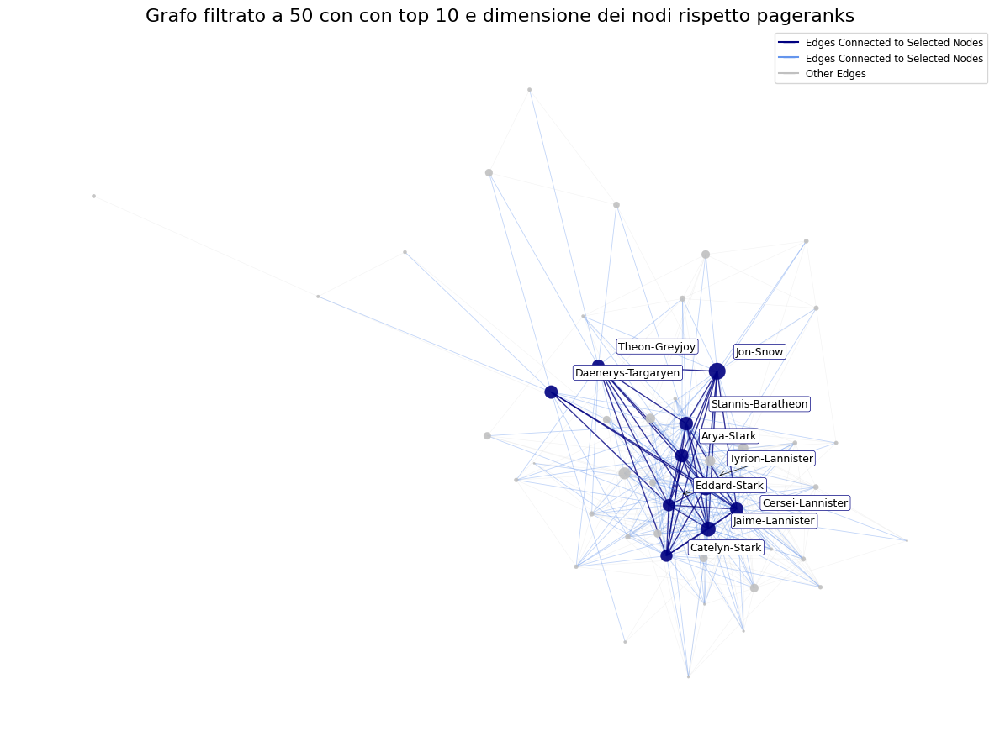

In [ ]:
filtered_graph_visualization(feature, ris, G, n=top_n*5, arrow=True, title=f'Grafo filtrato a {top_n*5} con con top {top_n} e dimensione dei nodi rispetto {feature}', edge=True)

## **Eigenvector Centrality**:  
   La *eigenvector centrality* misura l'importanza di un nodo in relazione all'importanza dei nodi a cui è connesso. In altre parole, un nodo con alta *eigenvector centrality* non solo è ben connesso, ma le sue connessioni sono con nodi importanti. Personaggi come Tyrion Lannister e Daenerys Targaryen potrebbero essere esempi di alta *eigenvector centrality*, poiché sono circondati da altri personaggi potenti e influenti.
   - **Utilità**: Rileva i personaggi che sono strategicamente situati vicino a nodi influenti, con il potenziale di esercitare un maggiore potere grazie alla qualità delle connessioni.

In [ ]:
feature = 'eigencentrality'
ris = print_top_characters(df, feature, top_n)

,10,2,4,6,138,64,20,24,14,15
Id,Tyrion-Lannister,Cersei-Lannister,Jaime-Lannister,Joffrey-Baratheon,Sansa-Stark,Robert-Baratheon,Eddard-Stark,Stannis-Baratheon,Catelyn-Stark,Robb-Stark
eigencentrality,1.0,0.925314,0.89004,0.843277,0.807674,0.774229,0.762143,0.734925,0.698765,0.693603


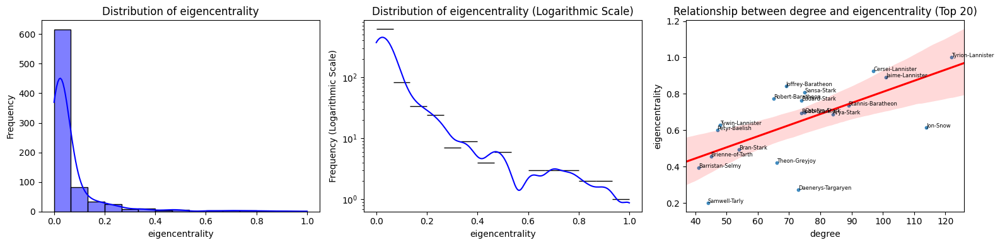

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

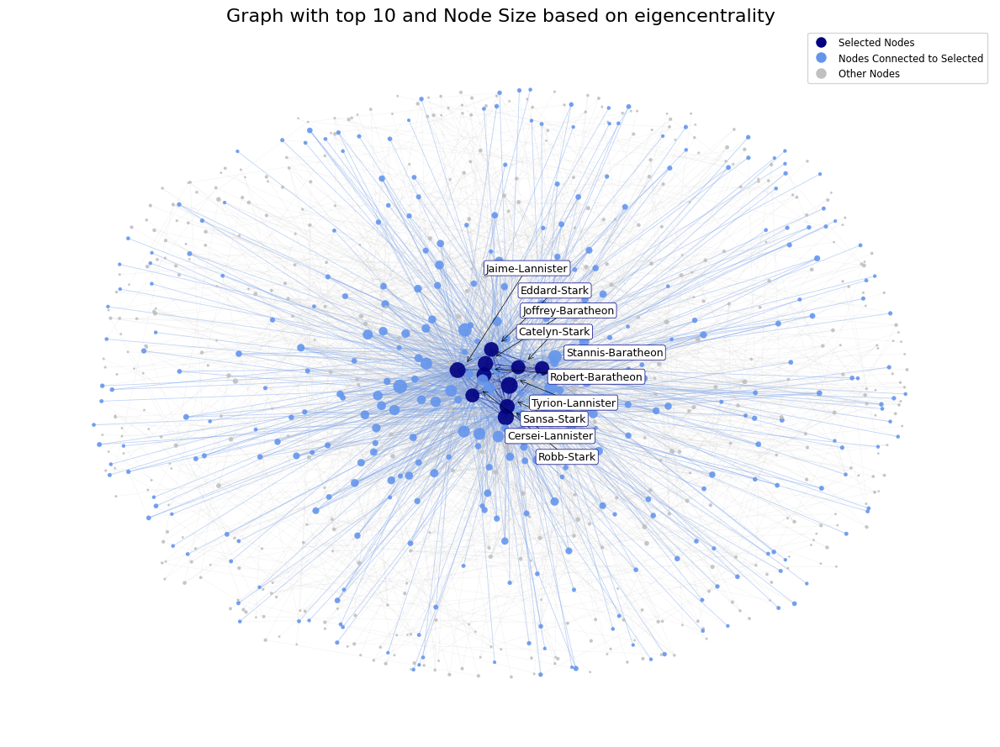

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}', edge=True, node=True)

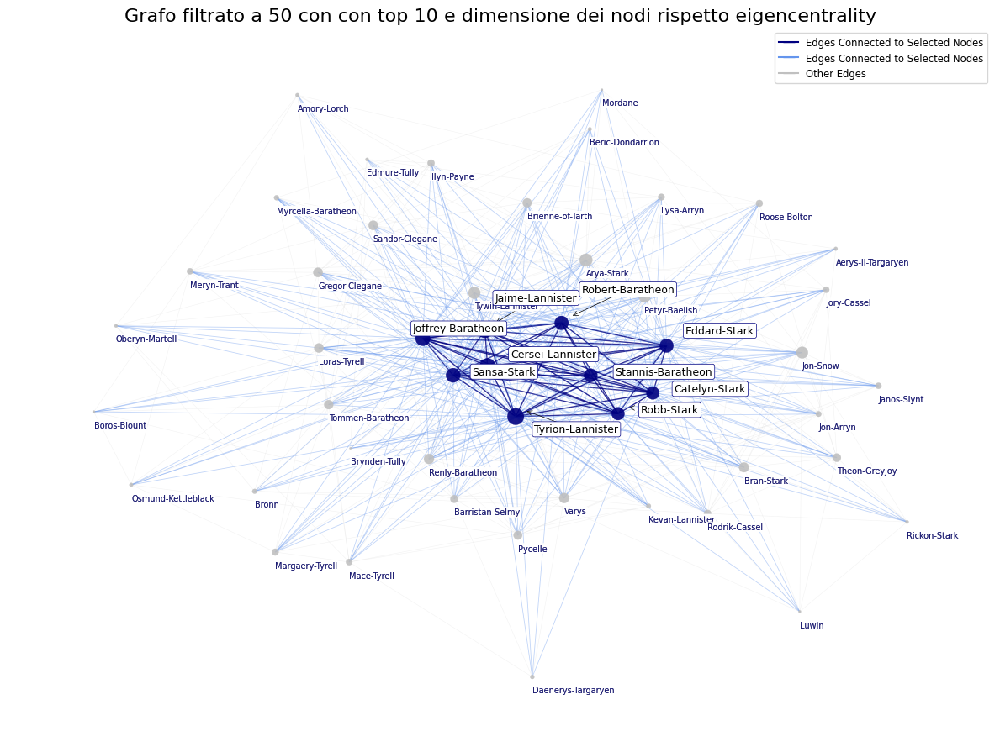

In [ ]:
filtered_graph_visualization(feature, ris, G, n=top_n*5, arrow=True, title=f'Grafo filtrato a {top_n*5} con con top {top_n} e dimensione dei nodi rispetto {feature}', edge=True, node_label=True)

## **Hub**:  
   I *hub* sono nodi che hanno una grande quantità di collegamenti in uscita. In *Game of Thrones*, i *hub* sono i personaggi che creano alleanze o che influenzano molti altri, come Daenerys o Tyrion. Essi sono i leader che dirigono l'azione e le decisioni verso altri nodi.
   - **Utilità**: Identifica i personaggi che giocano un ruolo cruciale nella diffusione di idee, risorse o comandi all'interno della rete.

In [ ]:
feature = 'Hub'
ris = print_top_characters(df, feature, top_n)

,10,2,4,6,138,64,20,24,14,15
Id,Tyrion-Lannister,Cersei-Lannister,Jaime-Lannister,Joffrey-Baratheon,Sansa-Stark,Robert-Baratheon,Eddard-Stark,Stannis-Baratheon,Catelyn-Stark,Robb-Stark
Hub,0.251562,0.235779,0.226345,0.214379,0.205847,0.194375,0.191659,0.182076,0.175885,0.173192


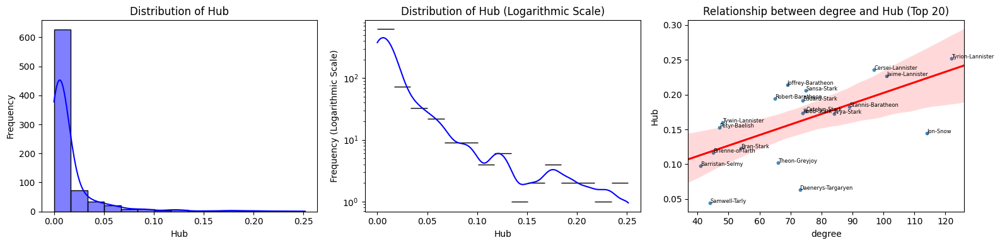

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

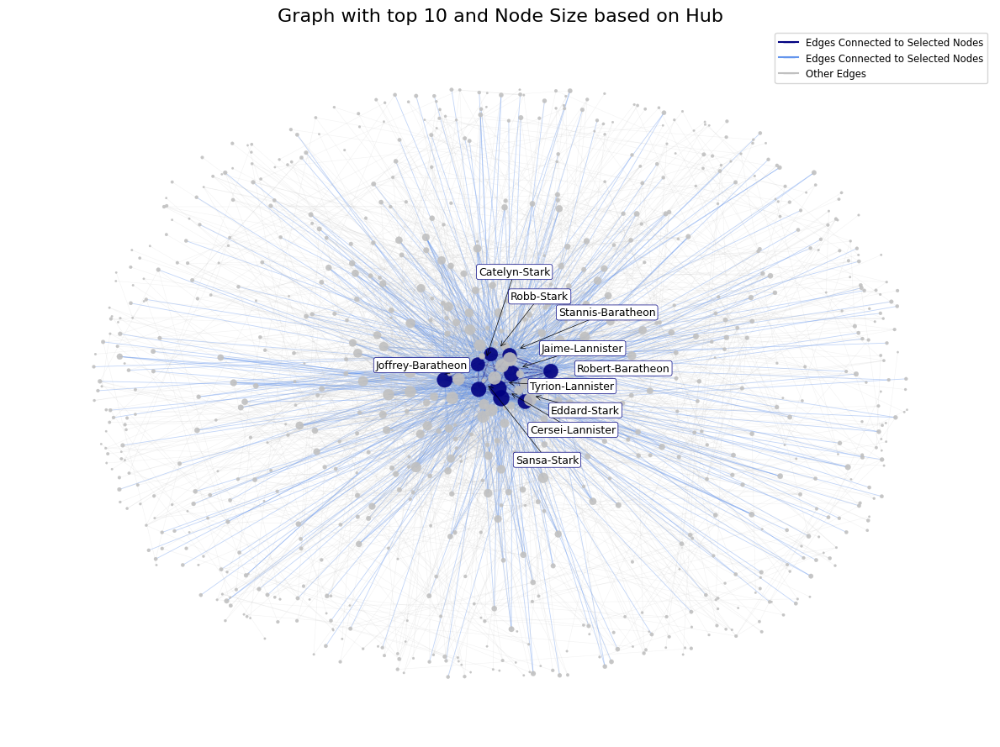

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}', edge=True)

##  **Authority**:  
   L'*authority* è una misura che riflette quanto un nodo è seguito o consultato, piuttosto che chi lo segue. In *Game of Thrones*, personaggi come Cersei o Jon Snow potrebbero essere considerati delle *authorities* nel senso che sono coloro che altri guardano per direzione e leadership.
   - **Utilità**: Aiuta a comprendere chi sono i personaggi che hanno autorità o legittimità nel prendere decisioni critiche per la rete.

In [ ]:
feature = 'Authority'
ris = print_top_characters(df, feature, top_n)

,10,2,4,6,138,64,20,24,14,15
Id,Tyrion-Lannister,Cersei-Lannister,Jaime-Lannister,Joffrey-Baratheon,Sansa-Stark,Robert-Baratheon,Eddard-Stark,Stannis-Baratheon,Catelyn-Stark,Robb-Stark
Authority,0.251562,0.235779,0.226345,0.214379,0.205847,0.194375,0.191659,0.182076,0.175885,0.173192


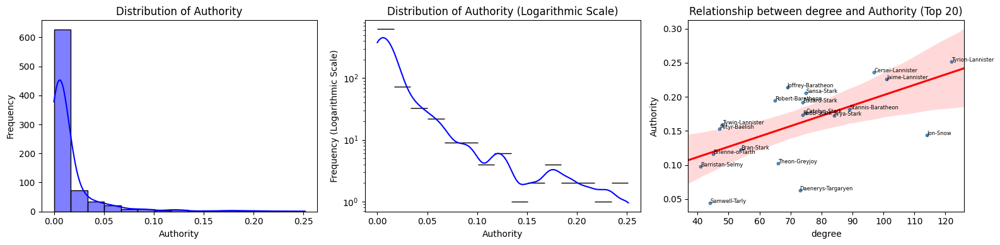

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

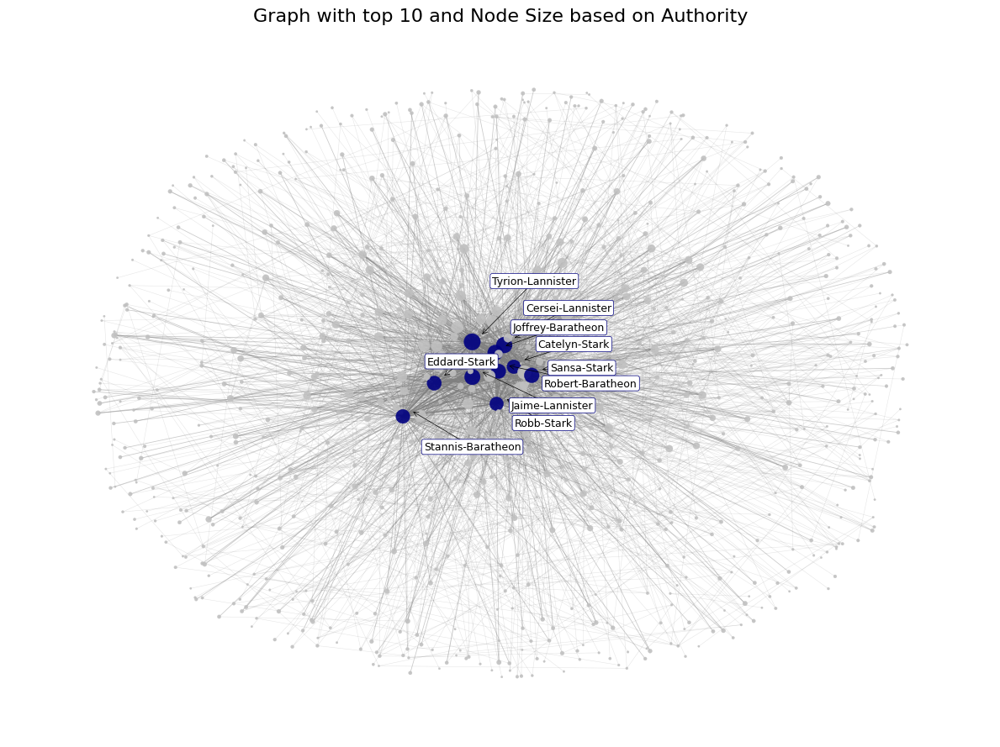

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}')

## **Weighted Degree**:  
   Il *weighted degree* è una variazione del *degree* che tiene conto non solo del numero di collegamenti, ma anche dell'intensità o del valore di ciascun legame (ad esempio, alleanze forti vs alleanze deboli). In *Game of Thrones*, le alleanze tra case potenti come Stark e Targaryen hanno un peso maggiore rispetto a relazioni minori.
   - **Utilità**: Permette di misurare non solo la quantità, ma anche la forza e l'importanza dei legami tra i personaggi.

In [ ]:
feature = 'weighted degree'
ris = print_top_characters(df, feature, top_n)

,10,59,2,6,20,19,4,138,120,64
Id,Tyrion-Lannister,Jon-Snow,Cersei-Lannister,Joffrey-Baratheon,Eddard-Stark,Daenerys-Targaryen,Jaime-Lannister,Sansa-Stark,Bran-Stark,Robert-Baratheon
weighted degree,2873,2757,2232,1762,1649,1608,1569,1547,1508,1488


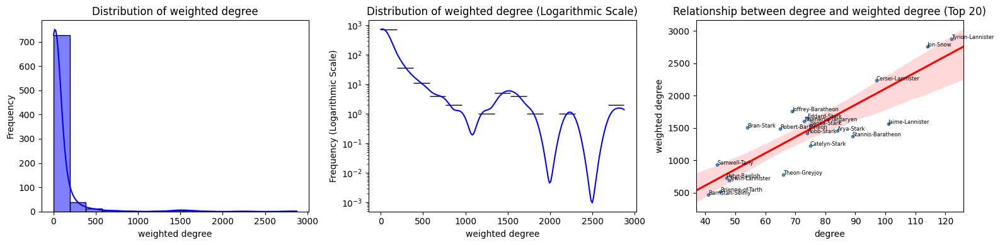

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

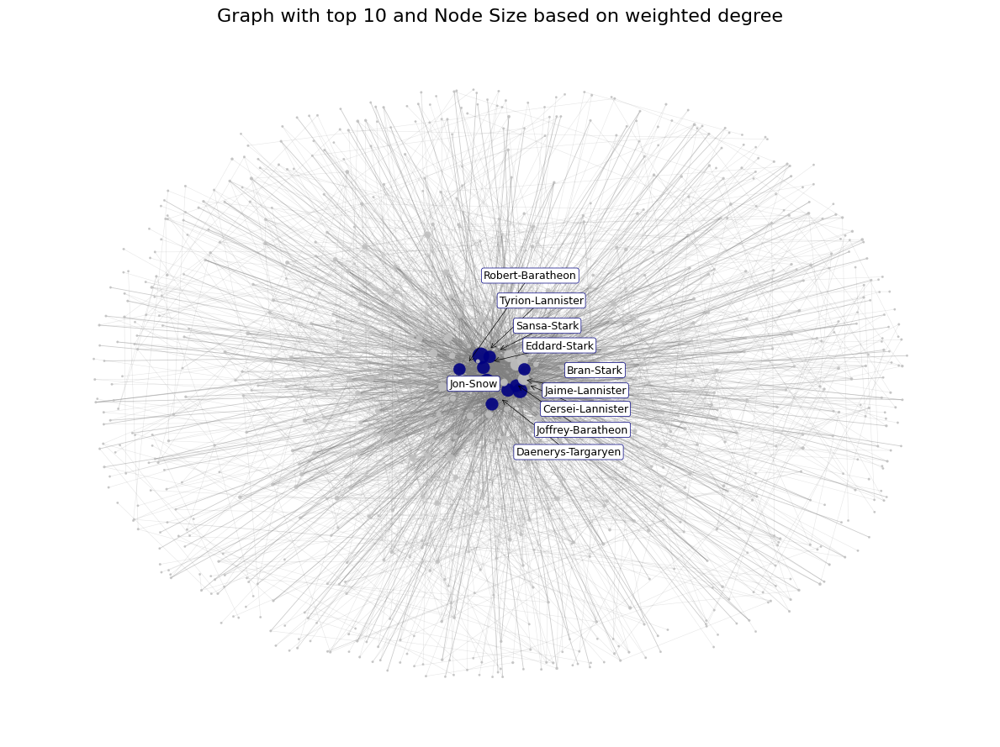

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}')

## **Harmonic Closeness Centrality**:  
   La *harmonic closeness centrality* è una variante della *closeness* che non penalizza troppo i nodi lontani. È utile per reti in cui i nodi sono distribuiti in modo irregolare, come nel caso delle case di *Game of Thrones*, che possono essere molto separate. La *harmonic closeness* misura la velocità con cui un nodo può raggiungere gli altri, tenendo conto di tutte le distanze.
   - **Utilità**: Fornisce una valutazione più precisa di quali personaggi sono in grado di influenzare l'intera rete in tempi relativamente brevi, anche in reti complesse e frammentate.

In [ ]:
feature = 'harmonicclosnesscentrality'
ris = print_top_characters(df, feature, top_n)

,10,59,2,4,20,24,64,15,68,14
Id,Tyrion-Lannister,Jon-Snow,Cersei-Lannister,Jaime-Lannister,Eddard-Stark,Stannis-Baratheon,Robert-Baratheon,Robb-Stark,Arya-Stark,Catelyn-Stark
harmonicclosnesscentrality,0.538365,0.513082,0.512159,0.511572,0.502935,0.500063,0.499769,0.49392,0.488386,0.487275


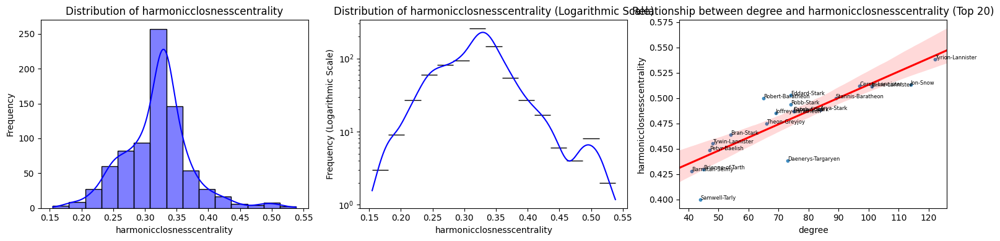

In [ ]:
plot_stat_graphs(df, feature, 'degree', top_n)

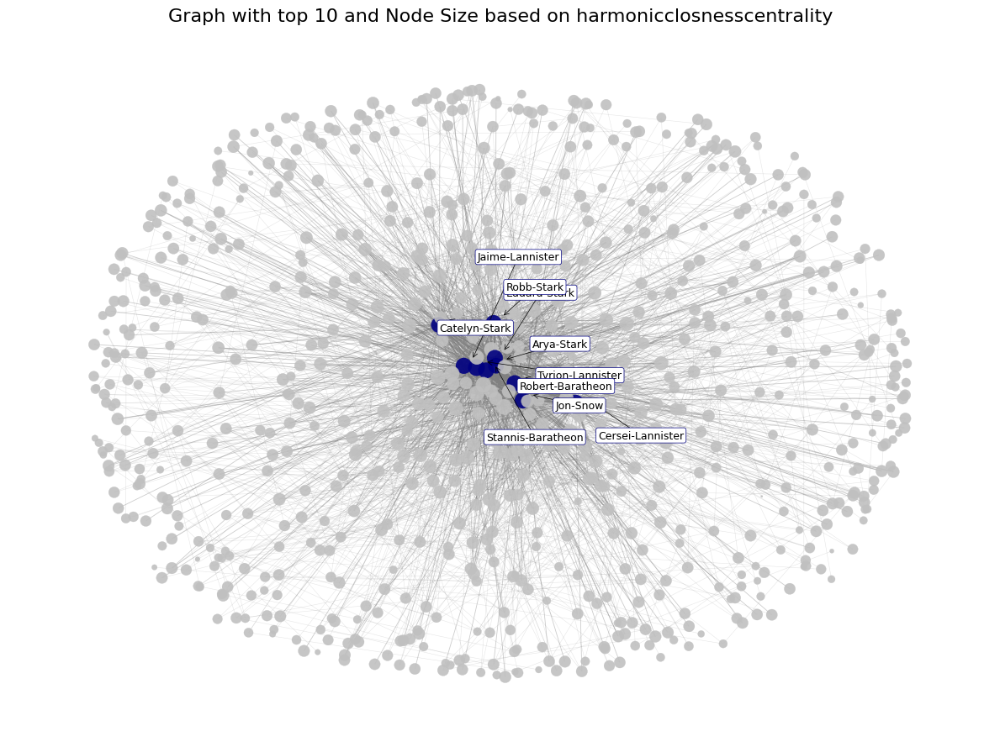

In [ ]:
graph_visualization(feature, ris, G, arrow=True, title=f'Graph with top {top_n} and Node Size based on {feature}')

#**ANALISI APPROFONDITE**

In [ ]:
eigenvector_threshold = df['eigencentrality'].mean()  # Soglia media

# Calcola le soglie dei percentili
degree_50_percentile = np.percentile(df['degree'], 50)  # 50° percentile
degree_85_percentile = np.percentile(df['degree'], 83)  # 85° percentile

# Filtra nodi con High EC e Degree nel range specificato
hidden_leaders = df[
    (df['eigencentrality'] > eigenvector_threshold) &  # High EC
    (df['degree'] > degree_50_percentile) &           # Degree > 50° percentile
    (df['degree'] < degree_85_percentile)             # Degree < 85° percentile
]

# Ordina rispetto all'eigenvector
hidden_leaders = hidden_leaders.sort_values(by=['eigencentrality'], ascending=False)
# Ordina in base a 'eigencentrality' in ordine decrescente

ris = hidden_leaders[:5]
print("Leader Nascosti Ordinati per Eigenvector:")
ris[['Id','eigencentrality','degree','pageranks','closnesscentrality','harmonicclosnesscentrality','betweenesscentrality','weighted degree','Authority','Hub']]

Leader Nascosti Ordinati per Eigenvector:


,Id,eigencentrality,degree,pageranks,closnesscentrality,harmonicclosnesscentrality,betweenesscentrality,weighted degree,Authority,Hub
313,Mandon-Moore,0.206368,9,0.001245,0.347162,0.374352,0.000023,57,0.053102,0.053102
446,Olenna-Redwyne,0.196215,9,0.001304,0.345052,0.372486,0.000293,55,0.050505,0.050505
403,Cleos-Frey,0.188948,7,0.001083,0.357947,0.385660,0.000020,86,0.047966,0.047966
252,Elmar-Frey,0.170334,9,0.001325,0.341495,0.369686,0.000105,45,0.043214,0.043214
425,Jacelyn-Bywater,0.166741,9,0.001230,0.338298,0.361509,0.000015,55,0.042783,0.042783


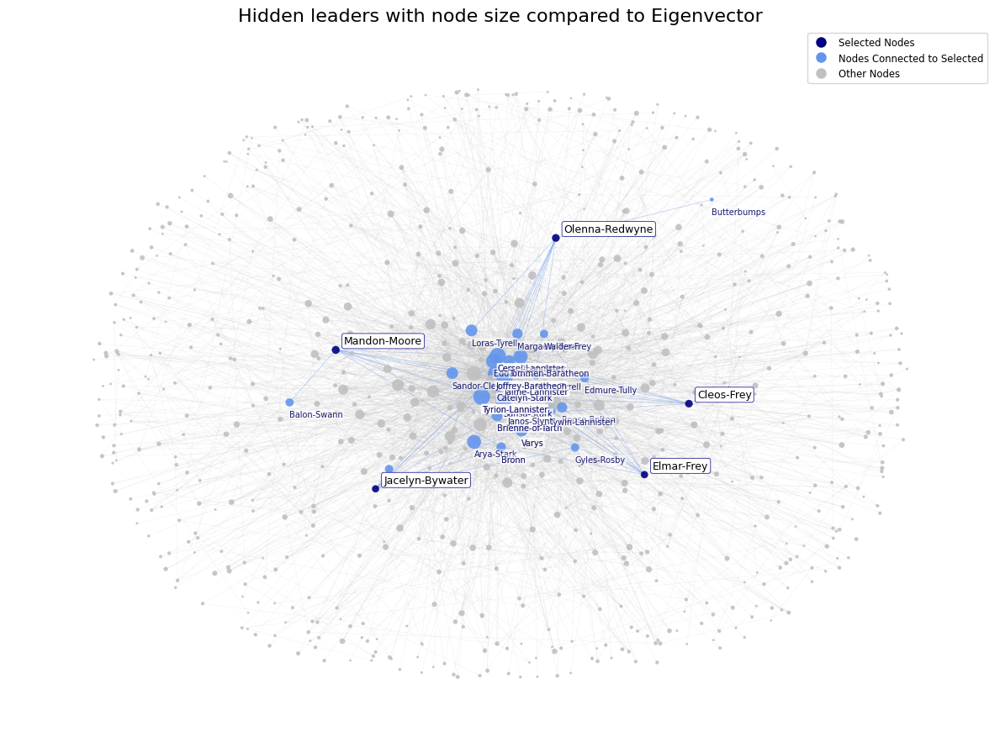

In [ ]:
graph_visualization('eigencentrality', ris, G, title='Hidden leaders with node size compared to Eigenvector', edge=True, node=True, node_label=True)

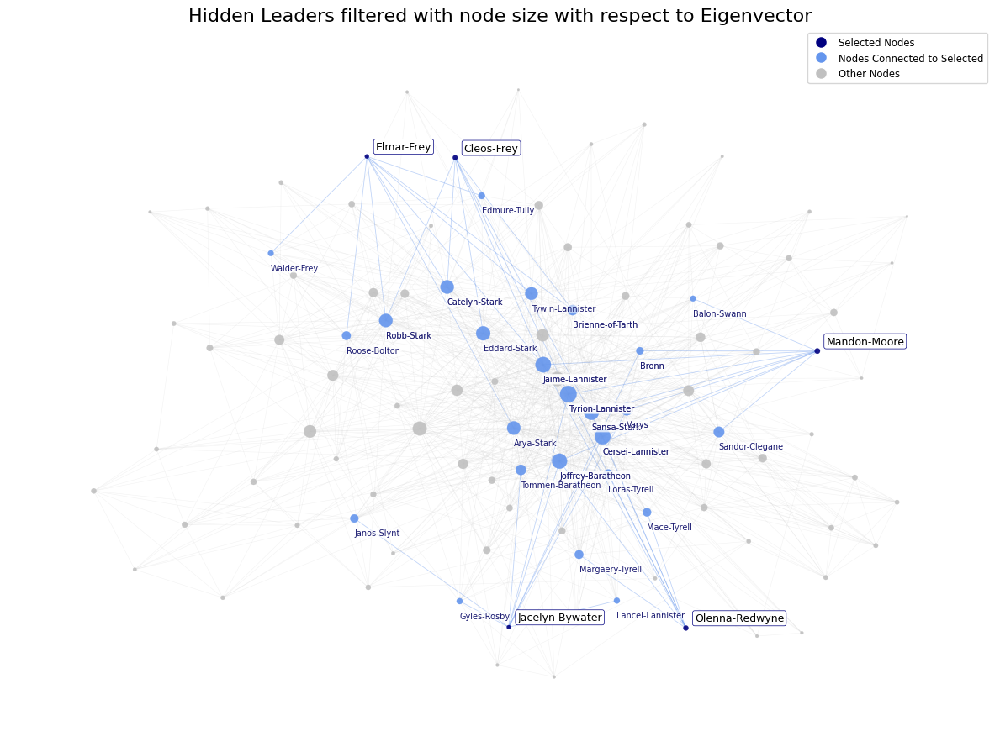

In [ ]:
filtered_graph_visualization('eigencentrality', ris, G, n=top_n*10, title='Hidden Leaders filtered with node size with respect to Eigenvector', edge=True, node=True, node_label=True)

In [ ]:
threshold = np.percentile(df['betweenesscentrality'], 85)  # 70° percentile

# Calcola le soglie dei percentili
degree_50_percentile = np.percentile(df['degree'], 50)  # 50° percentile
degree_85_percentile = np.percentile(df['degree'], 95)  # 85° percentile

# Filtra nodi con High EC e Degree nel range specificato
hidden_leaders = df[
    (df['betweenesscentrality'] >  threshold) &  # High EC
    (df['degree'] > degree_50_percentile) &           # Degree > 50° percentile
    (df['degree'] < degree_85_percentile)             # Degree < 85° percentile
]

# Ordina rispetto all'eigenvector
hidden_leaders = hidden_leaders.sort_values(by=['betweenesscentrality'], ascending=False)
# Ordina in base a 'eigencentrality' in ordine decrescente
ris=hidden_leaders[:5]
print("Mediatori Nascosti Ordinati per betweenesscentrality:")
ris[['Id','eigencentrality','degree','pageranks','closnesscentrality','harmonicclosnesscentrality','betweenesscentrality','weighted degree','Authority','Hub']] # Stampa le prime 5 righe dopo l'ordinamento

Mediatori Nascosti Ordinati per betweenesscentrality:


,Id,eigencentrality,degree,pageranks,closnesscentrality,harmonicclosnesscentrality,betweenesscentrality,weighted degree,Authority,Hub
187,Myrcella-Baratheon,0.297773,22,0.003123,0.377135,0.410566,0.020193,264,0.075360,0.075360
185,Arianne-Martell,0.051240,20,0.003824,0.295319,0.321710,0.017878,189,0.012294,0.012294
103,Ramsay-Snow,0.193825,23,0.003954,0.366359,0.399706,0.016713,241,0.047204,0.047204
215,Doran-Martell,0.208153,21,0.003047,0.360217,0.391740,0.014537,203,0.052176,0.052176
43,Alleras,0.015581,8,0.001810,0.272915,0.292683,0.014199,48,0.002925,0.002925


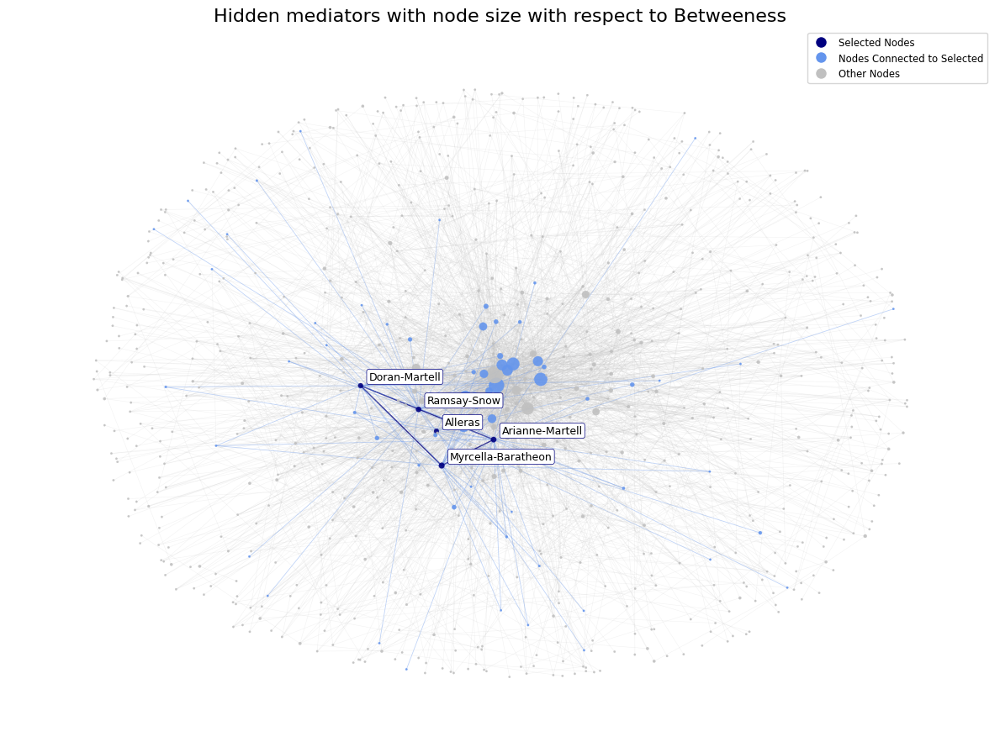

In [ ]:
graph_visualization('betweenesscentrality', ris, G, title='Hidden mediators with node size with respect to Betweeness', edge=True, node=True)

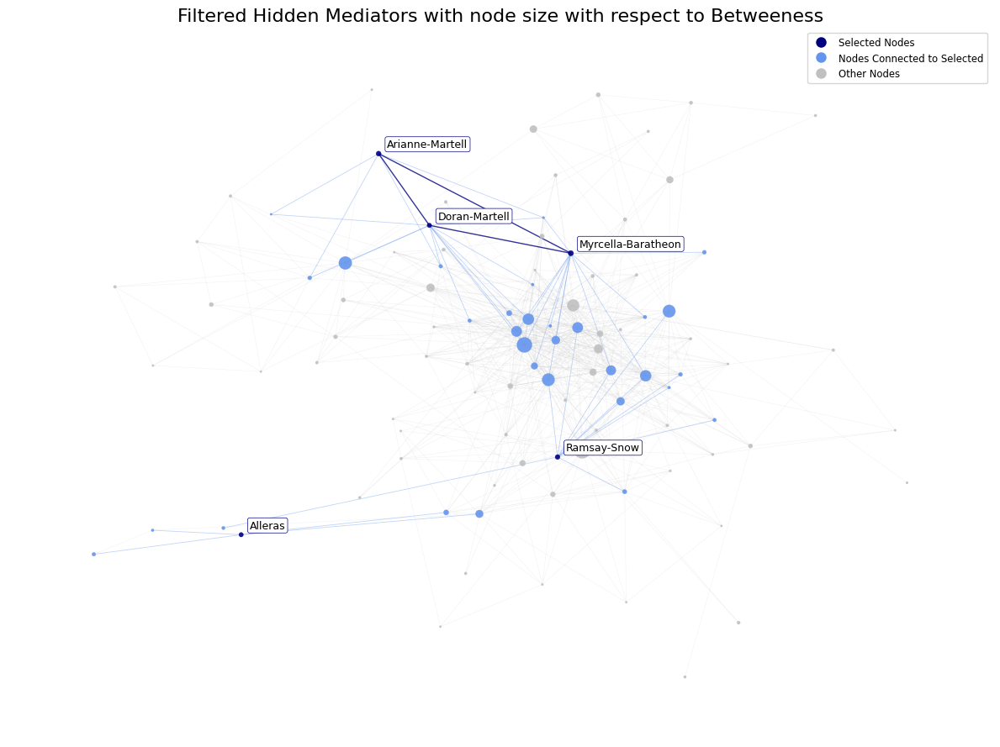

In [ ]:
filtered_graph_visualization('betweenesscentrality', ris, G, n=top_n*10, title='Filtered Hidden Mediators with node size with respect to Betweeness', edge=True, node=True)

# cliques e k-core

In [ ]:
import networkx as nx

# Supponiamo che G sia il grafo
# Trova tutte le cliques nel grafo
cliques = list(nx.find_cliques(G))

# Filtra le cliques con una dimensione significativa (es. almeno 3 nodi)
min_clique_size = 14
large_cliques = [clique for clique in cliques if len(clique) >= min_clique_size]

# Stampa i risultati
print(f"Cliques con almeno {min_clique_size} nodi:")
for clique in large_cliques:
    print(clique)


Cliques con almeno 14 nodi:
['Tyrion-Lannister', 'Cersei-Lannister', 'Joffrey-Baratheon', 'Sansa-Stark', 'Jaime-Lannister', 'Robert-Baratheon', 'Eddard-Stark', 'Petyr-Baelish', 'Renly-Baratheon', 'Stannis-Baratheon', 'Tywin-Lannister', 'Varys', 'Catelyn-Stark', 'Robb-Stark']


In [ ]:
import networkx as nx

# Supponiamo che G sia il grafo
k = 9  # Soglia per il k-core
k_core = nx.k_core(G, k=k)

print(f"Il {k}-core contiene {len(k_core.nodes)} nodi:")
print(k_core.nodes)


Il 9-core contiene 69 nodi:
['Polliver', 'Rodrik-Cassel', 'Sansa-Stark', 'Benjen-Stark', 'Varys', 'Arya-Stark', 'Myrcella-Baratheon', 'Mandon-Moore', 'Lysa-Arryn', 'Jory-Cassel', 'Edmure-Tully', 'Meryn-Trant', 'Barristan-Selmy', 'Mace-Tyrell', 'Eddard-Stark', 'Gregor-Clegane', 'Aerys-II-Targaryen', 'Theon-Greyjoy', 'Roose-Bolton', 'Tickler', 'Robert-Baratheon', 'Loras-Tyrell', 'Jon-Snow', 'Amory-Lorch', 'Gyles-Rosby', 'Robb-Stark', 'Balon-Swann', 'Doran-Martell', 'Bran-Stark', 'Osmund-Kettleblack', 'Qyburn', 'Walder-Frey', 'Cersei-Lannister', 'Ilyn-Payne', 'Boros-Blount', 'Pycelle', 'Elmar-Frey', 'Jon-Arryn', 'Catelyn-Stark', 'Addam-Marbrand', 'Renly-Baratheon', 'Daenerys-Targaryen', 'Jaime-Lannister', 'Lancel-Lannister', 'Joffrey-Baratheon', 'Rickon-Stark', 'Janos-Slynt', 'Ramsay-Snow', 'Kevan-Lannister', 'Tywin-Lannister', 'Stannis-Baratheon', 'Tyrion-Lannister', 'Dunsen', 'Petyr-Baelish', 'Bronn', 'Beric-Dondarrion', 'Sandor-Clegane', 'Rhaegar-Targaryen', 'Mordane', 'Tommen-Baratheo

In [ ]:
# Calcola il coreness per ciascun nodo
core_numbers = nx.core_number(G)

# Stampa i valori di coreness
print("Valori di coreness per ciascun nodo:")
#for node, core in core_numbers.items():
    #print(f"Nodo {node}: coreness {core}")

# Ordinamento per importanza (coreness decrescente)
sorted_core = sorted(core_numbers.items(), key=lambda x: x[1], reverse=True)

print(sorted_core[:40])

#print("\nNodi ordinati per coreness:")
#for node, core in sorted_core:
    #print(f"Nodo {node}: coreness {core}")


Valori di coreness per ciascun nodo:
[('Cersei-Lannister', 13), ('Jaime-Lannister', 13), ('Joffrey-Baratheon', 13), ('Tyrion-Lannister', 13), ('Tywin-Lannister', 13), ('Varys', 13), ('Catelyn-Stark', 13), ('Robb-Stark', 13), ('Eddard-Stark', 13), ('Stannis-Baratheon', 13), ('Robert-Baratheon', 13), ('Arya-Stark', 13), ('Brienne-of-Tarth', 13), ('Renly-Baratheon', 13), ('Sansa-Stark', 13), ('Gregor-Clegane', 13), ('Sandor-Clegane', 13), ('Petyr-Baelish', 13), ('Loras-Tyrell', 13), ('Pycelle', 13), ('Jon-Snow', 12), ('Theon-Greyjoy', 12), ('Barristan-Selmy', 12), ('Jon-Arryn', 12), ('Bran-Stark', 12), ('Mace-Tyrell', 12), ('Margaery-Tyrell', 12), ('Jory-Cassel', 12), ('Amory-Lorch', 12), ('Chiswyck', 12), ('Dunsen', 12), ('Ilyn-Payne', 12), ('Meryn-Trant', 12), ('Polliver', 12), ('Rafford', 12), ('Roose-Bolton', 12), ('Tickler', 12), ('Rodrik-Cassel', 12), ('Tommen-Baratheon', 12), ('Lysa-Arryn', 12)]


In [ ]:
# Colori per la personalizzazione
NODE_SELECT = 'navy'
NODE_DEFAULT = 'silver'
NODE_CONNECT = 'cornflowerblue'
EDGE_SELECT = NODE_SELECT
EDGE_DEFAULT = 'silver'
EDGE_CONNECT = NODE_CONNECT


#Calcola dimensioni e colori dei nodi
def calculate_node_properties(G, ris, attribute, node_flag):
  max_size, min_size = 200, 3
  centrality_values = [df.loc[df['Id'] == node, attribute].values[0] for node in G.nodes()]
  node_sizes = [
      min_size + (max_size - min_size) * (val - min(centrality_values)) / (max(centrality_values) - min(centrality_values))
      for val in centrality_values
  ]

  # Colora i nodi selezionati
  node_colors = [NODE_SELECT if node in ris['Id'].values else NODE_DEFAULT for node in G.nodes()]

  # Aggiorna colori dei nodi collegati ai nodi rossi
  if node_flag:
    for node_red in ris['Id']:
        for neighbor in G.neighbors(node_red):
          if neighbor not in ris['Id']:
            idx = list(G.nodes()).index(neighbor)
            if node_colors[idx] != NODE_SELECT:
              node_colors[idx] = NODE_CONNECT

  return node_sizes, node_colors

#Calcola proprietà degli archi
def calculate_edge_properties(G, ris, edge_flag):
  edge_colors, edge_widths, edge_alphas = [], [], []
  for u, v in G.edges():
    if u in ris['Id'].values and v in ris['Id'].values:
        edge_colors.append(EDGE_SELECT)
        edge_widths.append(1.0)
        edge_alphas.append(0.8)
    elif u in ris['Id'].values or v in ris['Id'].values:
        edge_colors.append(EDGE_CONNECT)
        edge_widths.append(0.6)
        edge_alphas.append(0.4)
    else:
        edge_colors.append(EDGE_DEFAULT)
        edge_widths.append(0.4)
        edge_alphas.append(0.2)

  if not edge_flag:
      return ['gray'] * len(G.edges()), edge_widths, edge_alphas
  else:
      return edge_colors, edge_widths, edge_alphas

#Aggiunge etichette ai nodi
def add_labels(pos, ris, arrow_flag, node_label_flag, G):
  label_texts = []

  # Etichette per nodi rossi
  red_labels = {node: node for node in ris['Id']}
  for node, label in red_labels.items():
      x, y = pos[node]
      label_texts.append(plt.text(x+ 0.02, y + 0.02, label, fontsize=9, bbox=dict(boxstyle="round,pad=0.2", fc='white', ec=NODE_SELECT, lw=0.5), zorder=5))

  # Regola le etichette con frecce se `arrow=True`
  if arrow_flag:
      adjust_text(
          label_texts,
          arrowprops=dict(arrowstyle='->', color='black', lw=0.5),
          only_move={'points': 'y', 'text': 'y'},
          expand_text=(1.5, 1.5),
          force_points=1.5,
          force_text=1.8,
          lim=200
      )

  # Etichette per nodi collegati, se node_label=True
  if node_label_flag:
    for node_red in ris['Id']:
      for neighbor in G.neighbors(node_red):
        if neighbor not in ris['Id'] and str(neighbor) not in red_labels:
          x, y = pos[neighbor]
          plt.text(x, y - 0.05, str(neighbor), fontsize=7, color='midnightblue',bbox=dict(boxstyle="round,pad=0.1", fc='white', ec="none", alpha=0.5))

def graph_kcore(attribute, ris, G, title='', edge=False, node=False, arrow=False, node_label=False):
  plt.figure(figsize=(12, 9))
  plt.title(title, fontsize=16)

  pos = nx.spring_layout(G, k=0.5, iterations=50)
  node_sizes, node_colors = calculate_node_properties(G, ris, attribute, node)
  # Calcola proprietà degli archi
  edge_colors, edge_widths, edge_alphas = calculate_edge_properties(G, ris, edge)
  # Disegna archi
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_widths, alpha=edge_alphas)
  # Disegna nodi
  nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9, linewidths=0.2)
  # Aggiungi etichette
  add_labels(pos, ris, arrow, node_label, G)
  # Aggiungi legenda

  if node or edge:
    legend_elements = []
    if node:
      legend_elements += [
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_SELECT, markersize=10, label='Selected Nodes'),
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_CONNECT, markersize=10, label='Nodes Connected to Selected'),
          plt.Line2D([], [], marker='o', color='w', markerfacecolor=NODE_DEFAULT, markersize=10, label='Other Nodes')
      ]
    else:
      legend_elements += [
        plt.Line2D([], [], marker='_', color=EDGE_SELECT, markersize=10, label='Edges Connected to Selected Nodes'),
        plt.Line2D([], [], marker='_', color=EDGE_CONNECT, markersize=10, label='Edges Connected to Selected Nodes'),
        plt.Line2D([], [], marker='_', color=EDGE_DEFAULT, markersize=10, label='Other Edges')
    ]
    plt.legend(handles=legend_elements, loc='upper right', fontsize='small')


  plt.tight_layout()
  plt.show()

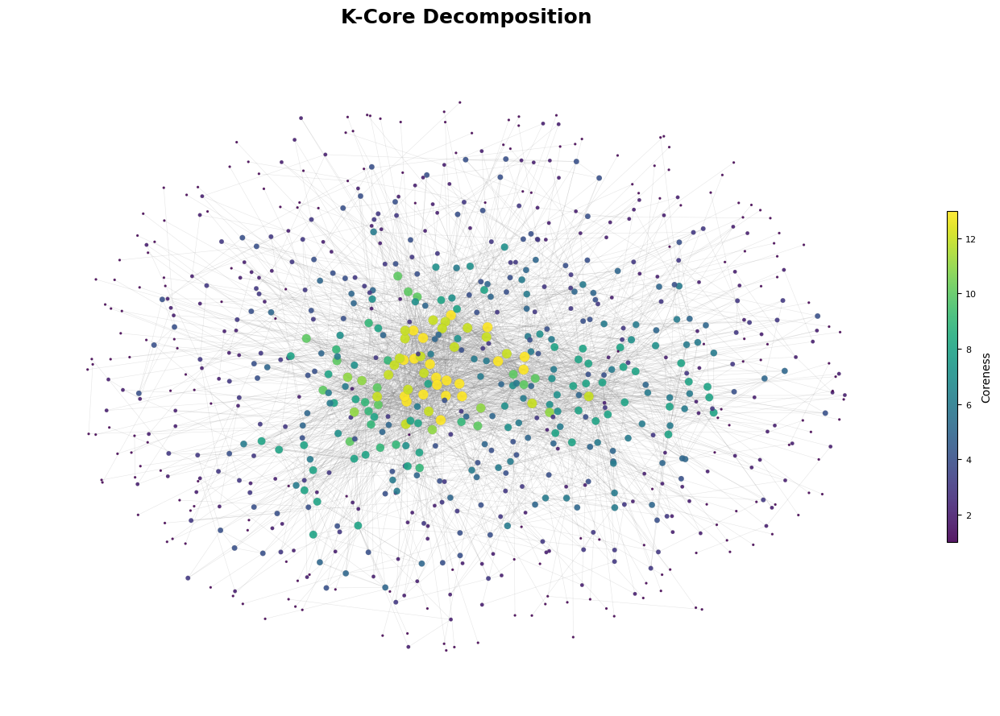

In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Parametri del grafo (assumi che G e core_numbers siano già definiti)
max_size, min_size = 80, 5  # Dimensioni minime e massime dei nodi

# Calcolo del layout e del coreness
pos = nx.spring_layout(G, k=0.3, iterations=50)
node_k_scale = [core_numbers[node] for node in G.nodes]
node_sizes = [
    min_size + (max_size - min_size) * (val - min(node_k_scale)) / (max(node_k_scale) - min(node_k_scale))
    for val in node_k_scale
]

# Normalizzazione per la colorbar
norm = mcolors.Normalize(vmin=min(node_k_scale), vmax=max(node_k_scale))
cmap = cm.viridis

# Crea la figura
fig, ax = plt.subplots(figsize=(14, 9))

# Disegna archi
nx.draw_networkx_edges(G, pos, edge_color='gray', width=0.4, alpha=0.2, ax=ax)

# Disegna nodi
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=node_k_scale, cmap=cmap, node_size=node_sizes, alpha=0.9, linewidths=0.1, edgecolors="gray", ax=ax
)

# Configura la colorbar
cbar = fig.colorbar(nodes, ax=ax, shrink=0.5, pad=0.02, aspect=30)
cbar.set_label('Coreness', fontsize=10)
cbar.ax.tick_params(labelsize=8)

# Titolo e rimozione degli assi
ax.set_title("K-Core Decomposition", fontsize=18, weight="bold", pad=20)
ax.axis('off')

# Mostra il grafico
plt.tight_layout()
plt.show()